In [96]:
import torch
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


In [97]:
mobilenet = models.mobilenet_v2(pretrained=True).features
for param in mobilenet.parameters():
    param.requires_grad_(False)
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet.to(device)


c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2dNormActivation(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (1): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (2): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (

In [98]:
def load_image(img_path, max_size=400, shape=None):
    image = Image.open(img_path).convert('RGB')
    
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
        
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
                    ])

    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

def imshow(tensor, title=None, ax=None, figsize=(5, 5)):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    image = tensor.cpu().clone().detach().numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    
    ax.imshow(image)
    if title is not None:
        ax.set_title(title)
    ax.axis('off')


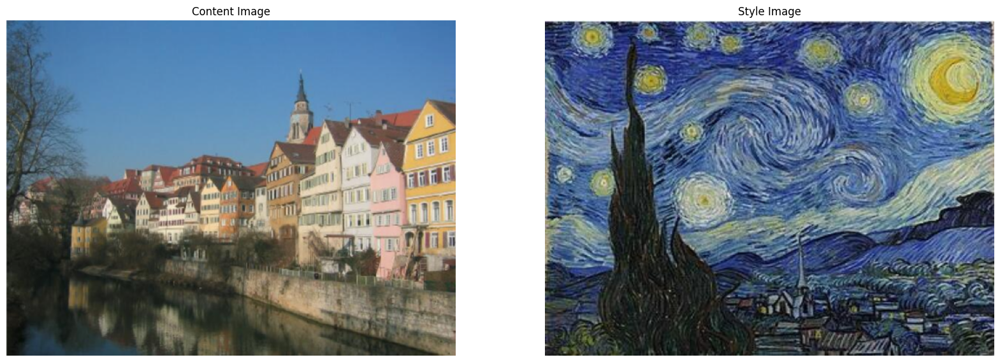

In [99]:
content_path = 'content2.jpg'
style_path = 'style2.jpg'

content_image = load_image(content_path).to(device)
style_image = load_image(style_path, shape=content_image.shape[-2:]).to(device)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
imshow(content_image, title='Content Image', ax=ax1)

imshow(style_image, title='Style Image', ax=ax2)


In [100]:
for name, layer in mobilenet._modules.items():
    print(name, layer)

0 Conv2dNormActivation(
  (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU6(inplace=True)
)
1 InvertedResidual(
  (conv): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
2 InvertedResidual(
  (conv): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): Conv2dNormActivation(
    

In [101]:
def get_features(image, model, layers=None):
    if layers is None:
        layers = {
            '0': 'conv1_1',  # Style layer
            '1': 'conv2_1',  # Style layer
            '2': 'conv3_1',  # Style layer
            '3': 'conv4_1',  # Style layer
            '4': 'conv5_1',  # Content layer
            '5': 'conv6_1',  # Style layer
            '6': 'conv7_1',  # Style layer
            '7': 'conv8_1',  # Style layer
            '8': 'conv9_1',  # Style layer
            '9': 'conv10_1',  # Style layer
            '10': 'conv11_1',  # Style layer
            '11': 'conv12_1',  # Style layer
            '12': 'conv13_1',  # Style layer
            '13': 'conv14_1',  # Style layer
            '14': 'conv15_1',  # Style layer
            '15': 'conv16_1',  # Style layer
            '16': 'conv17_1',  # Style layer

        }

    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features


In [102]:
def content_loss(content_features, target_features):
    return torch.mean((target_features - content_features)**2)


In [103]:
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

def style_loss(style_grams, target_features, style_weights):
    loss = 0
    for layer in style_weights:
        target_gram = gram_matrix(target_features[layer])
        _, d, h, w = target_features[layer].size()
        layer_loss = style_weights[layer] * torch.mean((target_gram - style_grams[layer])**2)
        loss += layer_loss / (d * h * w)
        
    return loss


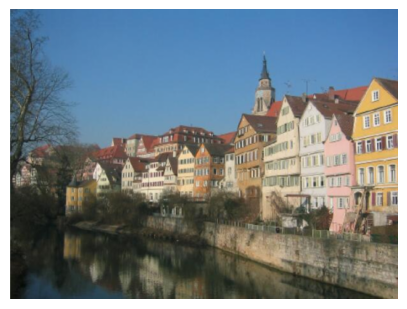

In [104]:
# Assuming content_image is already loaded
target = content_image.clone().requires_grad_(True).to(device)
# Assuming content_image has been preprocessed and is already on the device
# _, C, H, W = content_image.size()
# Create a new tensor with the same size, filled with random noise, and requiring gradient
# target = torch.randn(C, H, W, device=device).unsqueeze(0).requires_grad_(True)
imshow(target)


In [105]:
content_features = get_features(content_image, mobilenet)
style_features = get_features(style_image, mobilenet)
target_features = get_features(target, mobilenet)


In [106]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}


In [107]:
style_weights = {'conv1_1': 0.9,
                 'conv2_1': 0.5,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2,'conv6_1': 0.4,'conv7_1': 0.4,'conv8_1': 0.1,'conv9_1': 0.1}

# if train from random image, I found that content weight = 1e5 and style weight = 1e6 works ok
content_weight = 1e2
style_weight = 1e6
content_layer = 'conv5_1'


In [108]:
# Calculate content loss
content_loss_val = content_loss(content_features[content_layer], target_features[content_layer])

# Calculate style loss
style_loss_val = style_loss(style_grams, target_features, style_weights)

# Total loss
total_loss = content_weight * content_loss_val + style_weight * style_loss_val

style_loss_val, content_loss_val, total_loss


(tensor(3.4782, device='cuda:0', grad_fn=<AddBackward0>),
 tensor(0., device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(3478190., device='cuda:0', grad_fn=<AddBackward0>))

Iteration: 1 Total loss: 3478190.0


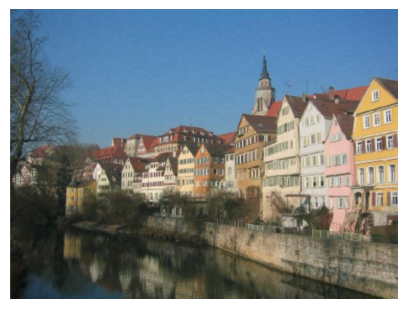

Iteration: 1000 Total loss: 907.5482177734375


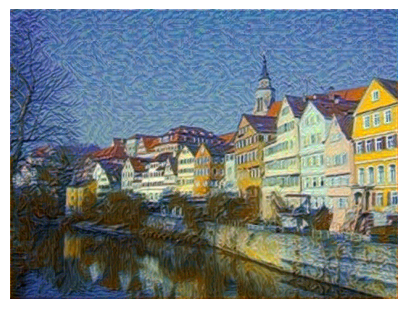

Iteration: 2000 Total loss: 266.6072998046875


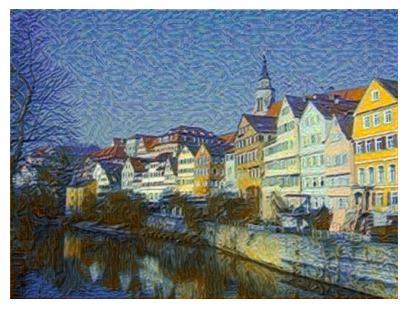

Iteration: 3000 Total loss: 138.66928100585938


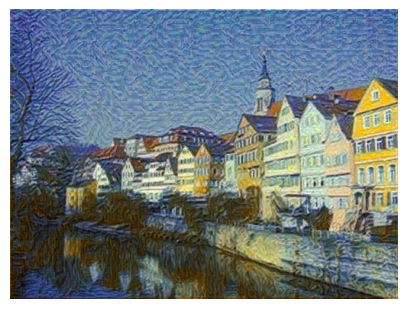

Iteration: 4000 Total loss: 86.34112548828125


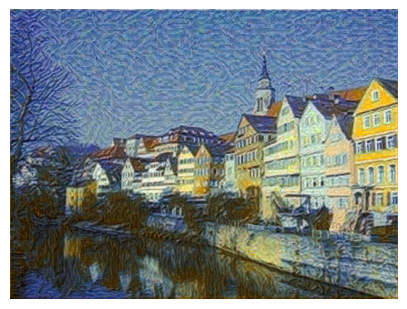

Iteration: 5000 Total loss: 109.64906311035156


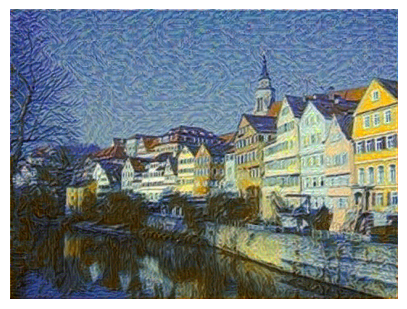

Iteration: 6000 Total loss: 56.065528869628906


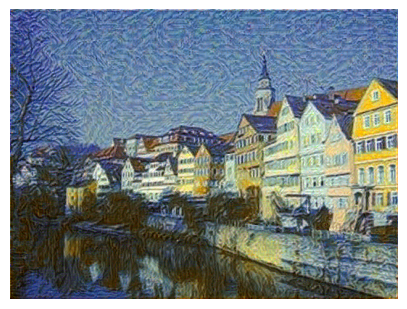

Iteration: 7000 Total loss: 781.4744873046875


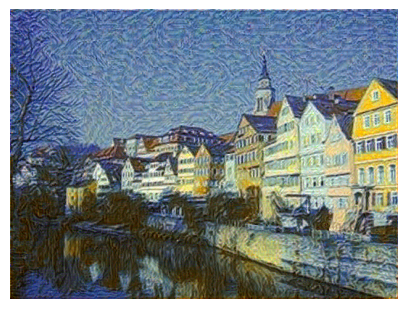

Iteration: 8000 Total loss: 66.88742065429688


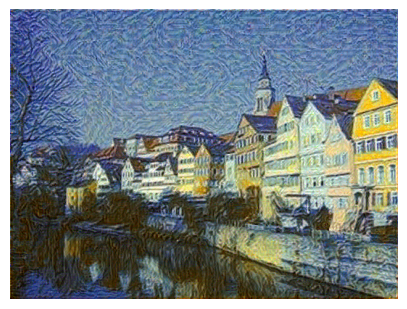

In [109]:
# For displaying the target image, intermittently
show_every = 1000

# Iteration hyperparameters
optimizer = optim.Adam([target.requires_grad_()], lr=0.02)
steps = 8000  # Decide how many iterations to update your image

for ii in range(1, steps + 1):

    target_features = get_features(target, mobilenet)
    
    content_loss_val = content_loss(content_features[content_layer], target_features[content_layer])
    
    style_loss_val = 0

    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_loss_val += layer_style_loss / (d * h * w)

    total_loss = content_weight * content_loss_val + style_weight * style_loss_val
    
    # Update the target image
    optimizer.zero_grad()
    # Backpropagation
    total_loss.backward()
    optimizer.step()
    
    # Display intermediate images and print the loss
    if ii % show_every == 0 or ii == 1:
        print('Iteration:', ii, 'Total loss:', total_loss.item())
        imshow(target)

        plt.show()


Iteration: 1 Total loss: 69.43268585205078


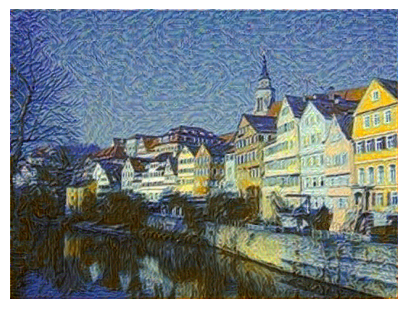

Iteration: 1000 Total loss: 529.7659301757812


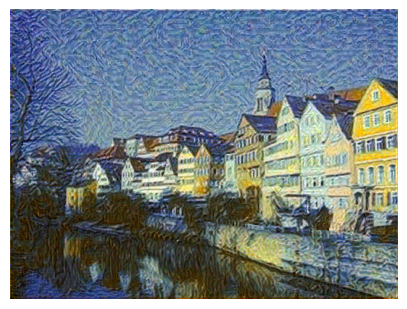

Iteration: 2000 Total loss: 65.15404510498047


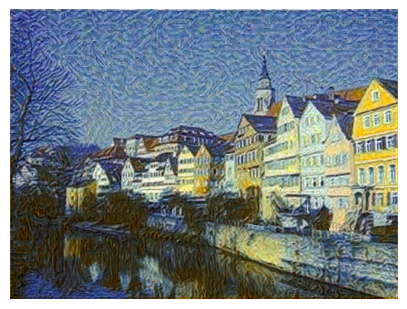

Iteration: 3000 Total loss: 45.748023986816406


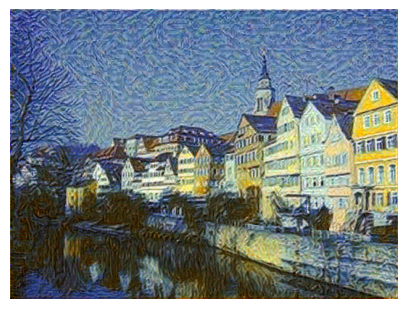

Iteration: 4000 Total loss: 325.9319152832031


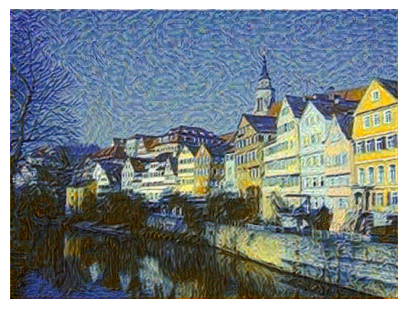

Iteration: 5000 Total loss: 42.04560089111328


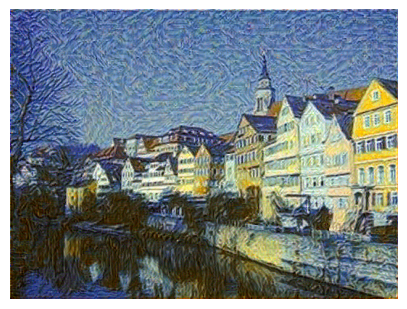

Iteration: 6000 Total loss: 45.27826690673828


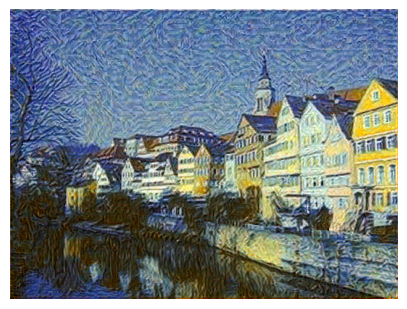

Iteration: 7000 Total loss: 47.187461853027344


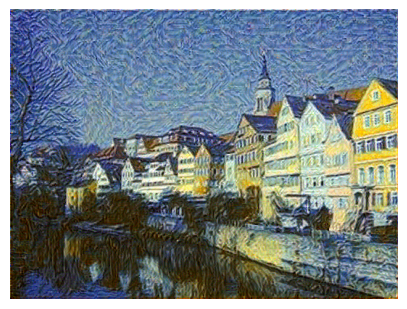

KeyboardInterrupt: 

In [110]:
import torch.optim as optim

def mobile_style_transfer(content_layer, content_image, style_image, target, content_weight, style_weight, style_weights, optimizer, steps, show_every,show_training= True):
    content_features = get_features(content_image, mobilenet)
    style_features = get_features(style_image, mobilenet)
    target_features = get_features(target, mobilenet)
    
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # content_layer = 'conv5_1'

    optimizer = optim.Adam([target.requires_grad_()], lr=0.02)

    for ii in range(1, steps + 1):
        target_features = get_features(target, mobilenet)

        content_loss_val = content_loss(content_features[content_layer], target_features[content_layer])

        style_loss_val = 0

        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            style_loss_val += layer_style_loss / (d * h * w)

        total_loss = content_weight * content_loss_val + style_weight * style_loss_val

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if (ii % show_every == 0 or ii == 1) and show_training:
            print('Iteration:', ii, 'Total loss:', total_loss.item())
            imshow(target)
            plt.show()

    return target

# Example usage:
mobile_style_transfer('conv5_1', content_image, style_image, target, content_weight, style_weight, style_weights, optimizer, steps, show_every)


In [113]:
def imshow(tensor, title=None, ax=None, figsize=(5, 5)):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    image = tensor.cpu().clone().detach().numpy().squeeze()
    image = image.transpose(1, 2, 0)
    # Reverse normalization to display the image correctly
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)

    ax.imshow(image)
    if title is not None:
        ax.set_title(title)
    ax.axis('off')


In [114]:
# Define function to test different parameters
def test_parameters(content_layer, content_image, style_image, content_weight, style_weight, optimizer, steps, show_every, layers_list, weights_list):
    results = []
    total_combinations = len(layers_list) * len(weights_list)
    current_combination = 0

    for layers in layers_list:
        for weights in weights_list:
            for content_layer in content_layers:
                current_combination += 1
                style_weights = {layer: weight for layer, weight in zip(layers, weights)}
                target = content_image.clone().requires_grad_(True)
                result = mobile_style_transfer(content_layer, content_image, style_image, target, content_weight, style_weight, style_weights, optimizer, steps, show_every, show_training=False)
                results.append((layers, weights, result))
                print(f"Processed combination {current_combination} out of {total_combinations}")
    return results


# Example usage
content_layers = ['conv5_1']
layers_list = [['conv1_1', 'conv2_1'], ['conv1_1', 'conv3_1', 'conv4_1']]
weights_list = [[0.5, 0.5], [0.3, 0.3, 0.4]]
results = test_parameters(content_layers, content_image, style_image, content_weight, style_weight, optimizer, 4000, show_every, layers_list, weights_list)




Processed combination 1 out of 4
Processed combination 2 out of 4
Processed combination 3 out of 4
Processed combination 4 out of 4


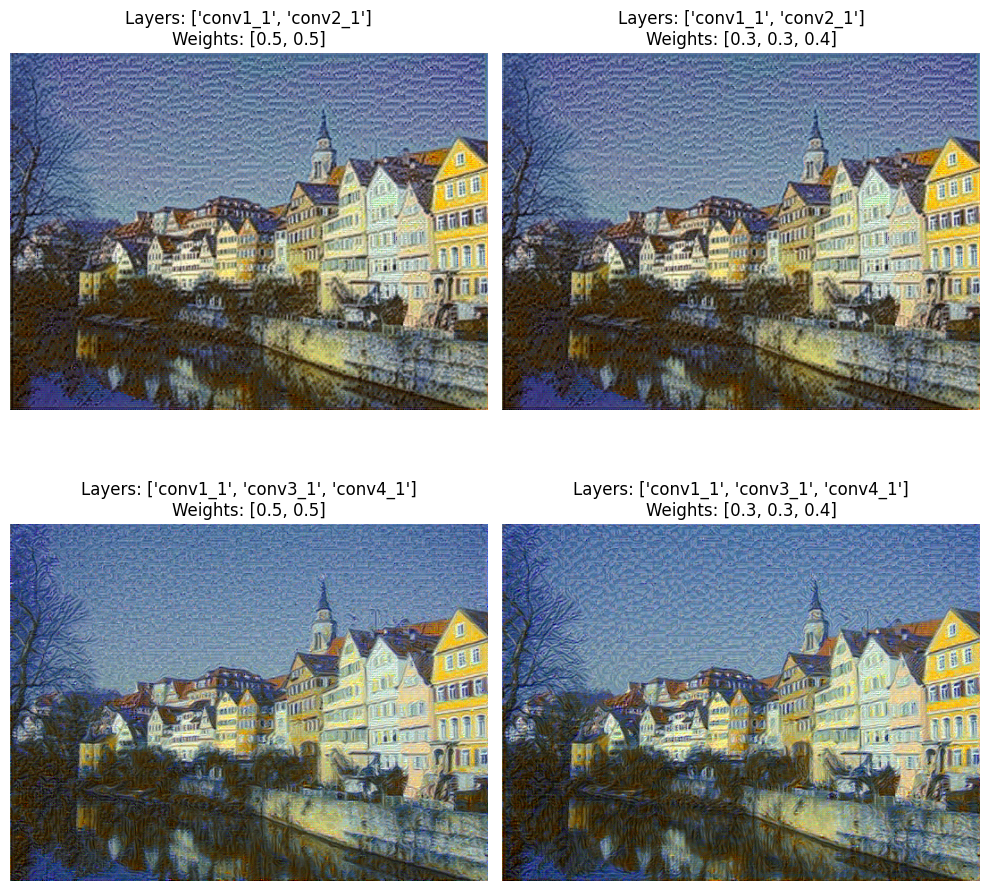

In [115]:
# Display results in a grid
fig, axes = plt.subplots(len(layers_list), len(weights_list), figsize=(10, 10))

for i, (layers, weights, result) in enumerate(results):
    row = i // len(weights_list)
    col = i % len(weights_list)
    ax = axes[row, col]
    # Pass the tensor to imshow function directly
    imshow(result.squeeze(), ax=ax)
    ax.set_title(f'Layers: {layers}\nWeights: {weights}')
    ax.axis('off')

plt.tight_layout()
plt.show()
